<a href="https://colab.research.google.com/github/Pakhi27/Amplitude-Envelope-Root-mean-square-energy-and-zero-crossing-rate/blob/main/Amplitude_Envelope_Root_mean_square_energy_and_zero_crossing_rate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd

In [2]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
BE_file = "/content/drive/MyDrive/BabyElephantWalk60.wav"
SW_file="/content/drive/MyDrive/StarWars3.wav"
Cb_file="/content/drive/MyDrive/CantinaBand60.wav"

In [4]:
# Load audio data and sampling rate
BE, sr = librosa.load(BE_file)

# Play the audio
ipd.Audio(data=BE, rate=sr)

In [5]:
# Load audio data and sampling rate
SW, sr1 = librosa.load(SW_file)

# Play the audio
ipd.Audio(data=SW, rate=sr)

In [6]:
# Load audio data and sampling rate
CB, sr2 = librosa.load(Cb_file)

# Play the audio
ipd.Audio(data=CB, rate=sr)

Root-mean-squared energy with Librosa

In [7]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

In [10]:
rms_BE = librosa.feature.rms(y=BE, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_SW = librosa.feature.rms(y=SW, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_CB = librosa.feature.rms(y=CB, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

Visualise RMSE + waveform

In [13]:
frames = range(len(rms_BE))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

In [14]:
frames1 = range(len(rms_SW))
t1 = librosa.frames_to_time(frames1, hop_length=HOP_LENGTH)

In [15]:
frames2 = range(len(rms_CB))
t2 = librosa.frames_to_time(frames2, hop_length=HOP_LENGTH)

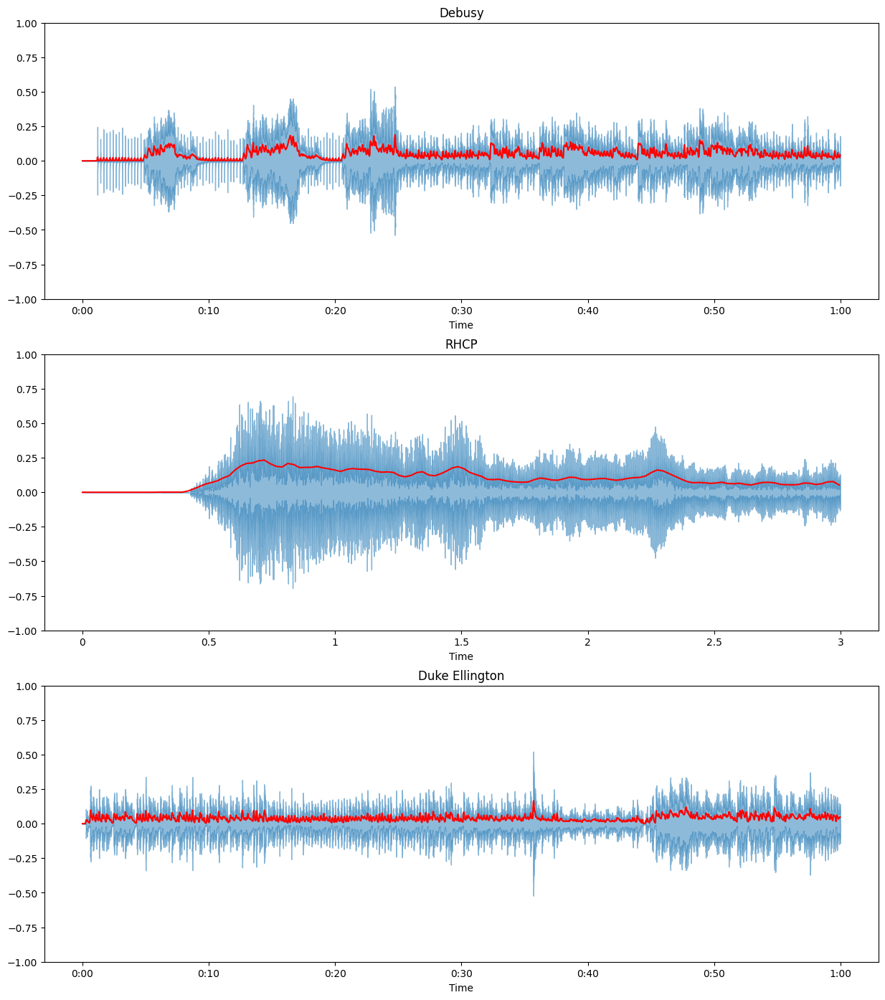

In [18]:
# rms energy is graphed in red

plt.figure(figsize=(15, 17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(BE, alpha=0.5)
plt.plot(t, rms_BE, color="r")
plt.ylim((-1, 1))
plt.title("Debusy")

plt.subplot(3, 1, 2)
librosa.display.waveshow(SW, alpha=0.5)
plt.plot(t1, rms_SW, color="r")
plt.ylim((-1, 1))
plt.title("RHCP")

plt.subplot(3, 1, 3)
librosa.display.waveshow(CB, alpha=0.5)
plt.plot(t2, rms_CB, color="r")
plt.ylim((-1, 1))
plt.title("Duke Ellington")

plt.show()

In [ ]:
# RMSE from scratch

In [19]:
def rmse(signal, frame_size, hop_length):
    rmse = []

    # calculate rmse for each frame
    for i in range(0, len(signal), hop_length):
        rmse_current_frame = np.sqrt(sum(signal[i:i+frame_size]**2) / frame_size)
        rmse.append(rmse_current_frame)
    return np.array(rmse)

In [20]:
rms_BE = rmse(BE, FRAME_SIZE, HOP_LENGTH)
rms_SW = rmse(SW, FRAME_SIZE, HOP_LENGTH)
rms_CB = rmse(CB, FRAME_SIZE, HOP_LENGTH)

In [24]:
rms_BE.shape

(2584,)

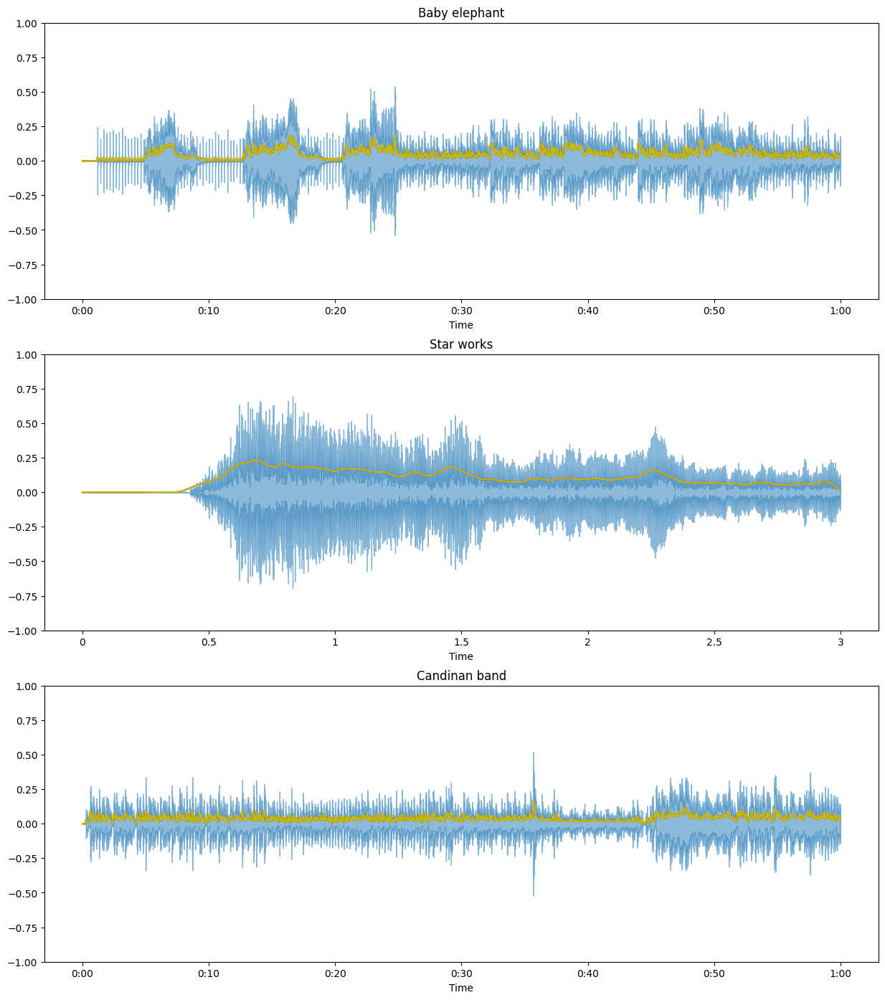

In [23]:
plt.figure(figsize=(15, 17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(BE, alpha=0.5)
plt.plot(t, rms_BE, color="r")
plt.plot(t, rms_BE, color="y")
plt.ylim((-1, 1))
plt.title("Baby elephant")

plt.subplot(3, 1, 2)
librosa.display.waveshow(SW, alpha=0.5)
plt.plot(t1, rms_SW, color="r")
plt.plot(t1, rms_SW, color="y")
plt.ylim((-1, 1))
plt.title("Star works")

plt.subplot(3, 1, 3)
librosa.display.waveshow(CB, alpha=0.5)
plt.plot(t2, rms_CB, color="r")
plt.plot(t2, rms_CB, color="y")
plt.ylim((-1, 1))
plt.title("Candinan band")

plt.show()

Zero-crossing rate with Librosa

In [25]:
zcr_BE = librosa.feature.zero_crossing_rate(BE, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
zcr_SW = librosa.feature.zero_crossing_rate(SW, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
zcr_CB = librosa.feature.zero_crossing_rate(CB, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [26]:
zcr_BE.size


2584

Visualise zero-crossing rate with Librosa

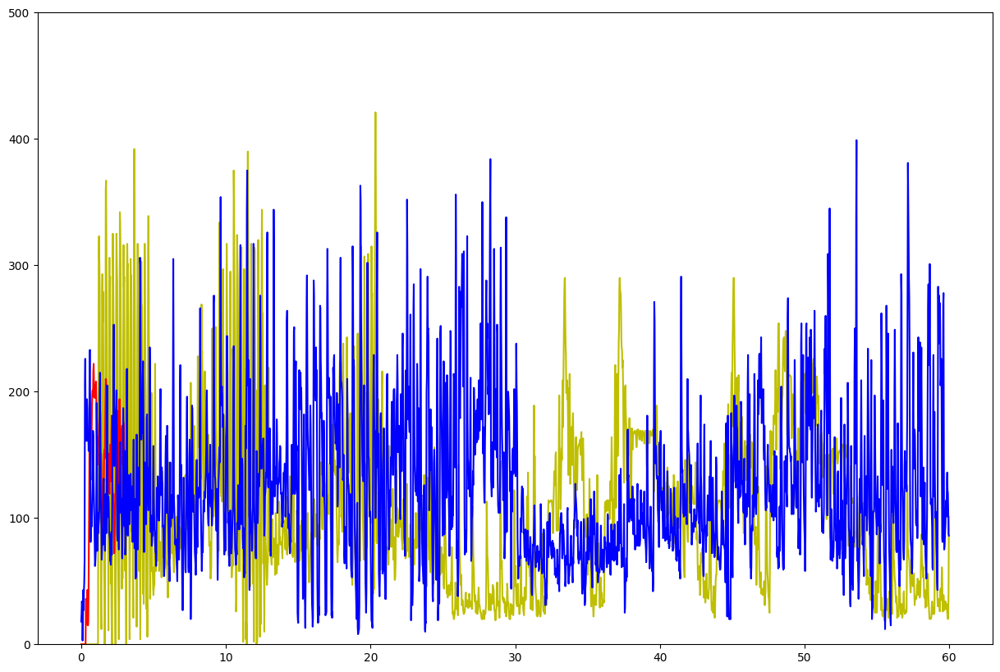

In [33]:
plt.figure(figsize=(15, 10))

plt.plot(t, zcr_BE*FRAME_SIZE, color="y")
plt.plot(t1, zcr_SW*FRAME_SIZE, color="r")
plt.plot(t2, zcr_CB*FRAME_SIZE, color="b")
plt.ylim(0, 500)
plt.show()

In [ ]:
# ZCR: Voice vs Noise

In [34]:
voice_file = "/content/drive/MyDrive/BabyElephantWalk60.wav"
noise_file = "/content/drive/MyDrive/white-noise-171891.mp3"


In [35]:
voice,_ = librosa.load(voice_file,duration=15)
noise,_ = librosa.load(noise_file,duration=15)

In [36]:
ipd.Audio(voice_file)

In [37]:
ipd.Audio(noise_file)


In [ ]:
#zcr

In [45]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

In [46]:
zcr_voice = librosa.feature.zero_crossing_rate(voice, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [47]:
zcr_noise= librosa.feature.zero_crossing_rate(noise, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [48]:
frames = range(len(zcr_voice))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)


In [49]:
frames = range(len(zcr_noise))
t1 = librosa.frames_to_time(frames, hop_length=HOP_LENGTH
                            )

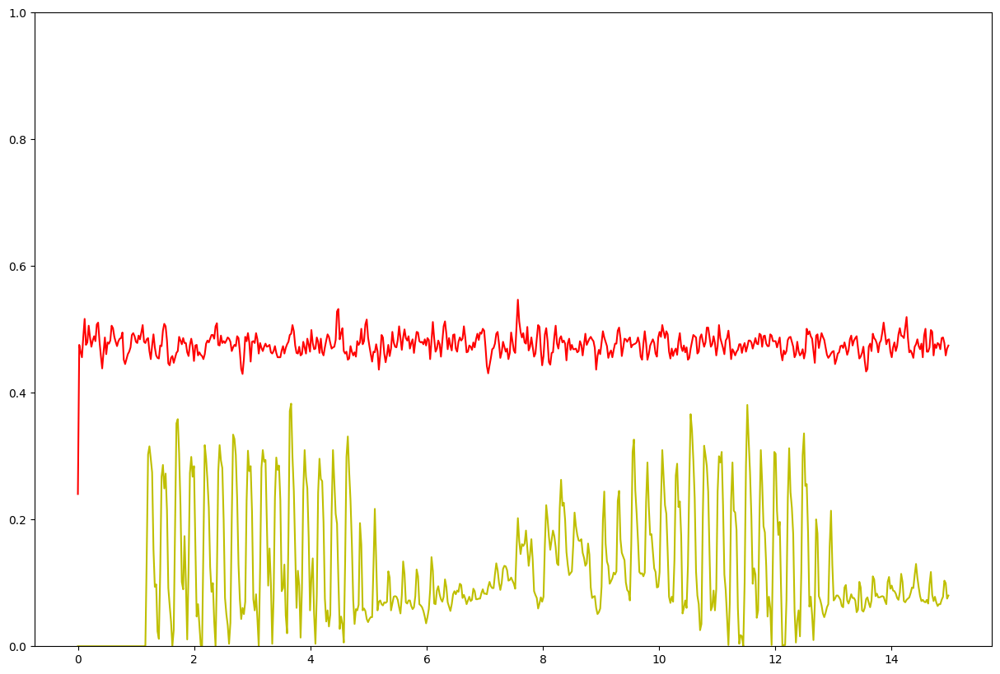

In [56]:
plt.figure(figsize=(15, 10))

plt.plot(t, zcr_voice, color="y")
plt.plot(t1, zcr_noise, color="r")
plt.ylim(0, 1)
plt.show()

# Noise has a higher number of zero crossing rates than Voice
